<a href="https://colab.research.google.com/github/emgrande/Env_Hydro/main/streams_MAR_residence_time_using_Rn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Codes from: Quantifying residence times of bank filtrate: A novel framework using radon as a natural tracer by Sven Frei and Ben Gilfedder (2021)

### Original codes in Matlab can be found in the supporting information of the online manuscript, [here](https://www.sciencedirect.com/science/article/pii/S0043135421005741?via%3Dihub).



This script runs the optimization routine to estimate the mean RT of
bankfiltrate based on an measured $^{222}$Rn-Activity. The script uses two
RT-distributions and a vector of different mixing ratios to estimate mean
RT for the bankfiltrate component.

F1 --> RT distribution for the bank filtrate component

F2 --> RT for the deep groundwater


The two distributions are combined into a single composite RT distribution
according to F3=m_ratio*F1+(1-m_ratio)F2. F3 than is used in a convolution
to estimate the mean RT of F1 where the parameters of F1 are modified as
part of an optimization routine depending on the pre-defined mixing ratios.



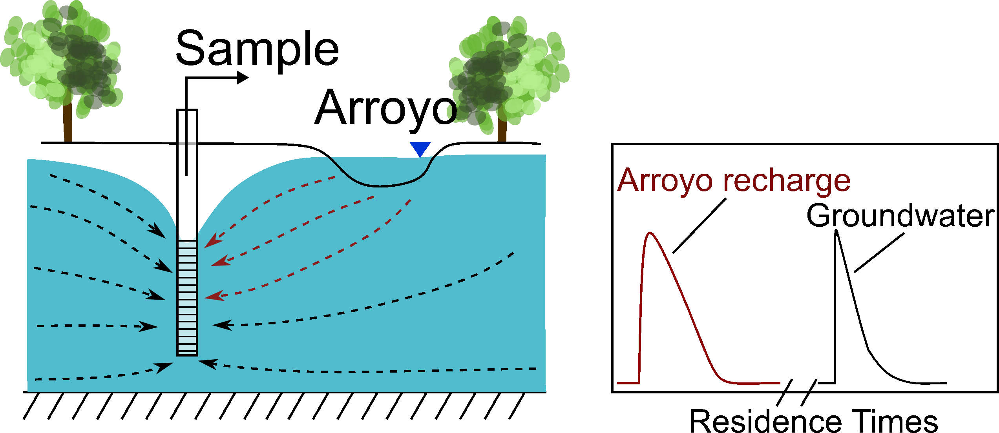

Example Figure

In [ ]:
install.packages('pracma')

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
#Optimization function

opt_fct <- function(x, mixing_ratio, lambda_val, gamma_val, a, aa, Cin, Cobs, shape_alpha, shape_alpha_deep, shape_beta_deep) {

  # Gamma pdf
  shape_beta <- x / shape_alpha
  f1 <- function(t) { dgamma(t, shape_alpha, scale = shape_beta) }
  f2 <- function(t) { dgamma(t, shape_alpha_deep, scale = shape_beta_deep) }

  # Mixture distribution model
  f3 <- function(t) { mixing_ratio * f1(t - aa) + (1 - mixing_ratio) * f2(t - a) }

  # Define REX function
  REX <- function(t) { exp(-lambda_val * t) * f3(t) }

  # Calculate integrals
  integral_f3 <- integrate(f3, lower = 0, upper = Inf, rel.tol = 1e-8)
  integral_REX <- integrate(REX, lower = 0, upper = Inf, rel.tol = 1e-8)


  RN_out_1 <- gamma_val / lambda_val * integral_f3$value - gamma_val / lambda_val * integral_REX$value
  RN_out_2 <- integral_REX$value

  Cout <- RN_out_2 * Cin + RN_out_1
  R <- Cobs - Cout
  return(R)
}


In [ ]:
#mixing model function

mixture_model_optimization_fct <- function(end_m, c_in, c_obs, m_ratio, alpha_s, aa, shape_alpha_deep, shape_beta_deep, a) {
  # Parameters
  lambda_val <- 0.18  # Decay constant of 222Rn 1/d
  endmember <- end_m  # Endmember deep GW
  Cin <- c_in  # River 222Rn-Activity
  gamma_val <- endmember * lambda_val  # Emission
  mixing_ratio <- m_ratio  # Mixing ratio river/gw
  Cobs <- c_obs  # Observed 222Rn-Activity

  # Shape for river_gw RT
  shape_alpha <- alpha_s  # Shape factor alpha for Gamma pdf river_water

  # Time_shift for river GW
  aa_val <- aa

  # Shape for deep_gw RT
  shape_alpha_deep_val <- shape_alpha_deep
  shape_beta_deep_val <- shape_beta_deep

  # Time_shift for deep GW
  a_val <- a

  # Define the range of residence times
  x_val <- seq(0.01, 200, length.out = 100000)

  # Define optimization function
  Copt <- function(x_val) {
    opt_fct(x_val, mixing_ratio, lambda_val, gamma_val, a_val, aa_val, Cin, Cobs, shape_alpha, shape_alpha_deep_val, shape_beta_deep_val)
  }

  # Perform optimization
  opts <- list('xtol' = 1e-8, 'maxfev' = 10000)
  x_sol2 <- uniroot(Copt, interval = c(1e-8, 1000), tol = 1e-8, maxiter = 10000)$root
  # Use a large but finite upper limit
  tmean <- x_sol2

  # Mixture distribution model
  shape_beta <- tmean / shape_alpha

  f1 <- function(t) { dgamma(t - aa_val, shape_alpha, scale = shape_beta) }
  f2 <- function(t) { dgamma(t - a_val, shape_alpha_deep_val, scale = shape_beta_deep_val) }
  f3 <- function(t) { mixing_ratio * f1(t) + (1 - mixing_ratio) * f2(t) }

  return(list(x_val, f1(x_val), f2(x_val), f3(x_val), tmean))
}


### Run an example

In [ ]:
# Test parameters
end_m <- 8340 #Bq/m3
c_in <- 270   #Bq/m3
c_obs <- 8000 #Bq/m3
shape_alpha <- 3
aa <- 0
shape_alpha_deep <- 3
shape_beta_deep <- 5
a <- 50

m_ratio <- c(0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9)

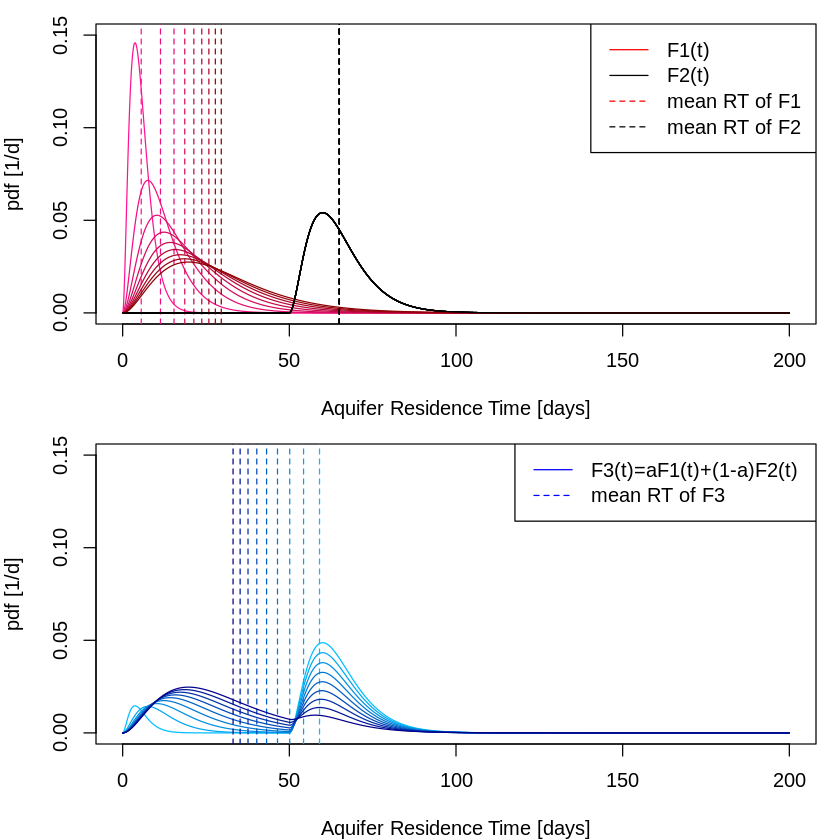

In [ ]:
#plot the data
par(mar = c(4,4,1,1))
par(mfrow = c(2,1))
plot(x = 0:200, y = 0:200, ylim = c(0, 0.15), xlab = "Aquifer Residence Time [days]", ylab = "pdf [1/d]",
     type = 'n')

fun_color_range <- colorRampPalette(c("deeppink", "darkred"))
cols <- fun_color_range(as.numeric(length(m_ratio)))

for (i in 1:length(m_ratio)) {
  result <- mixture_model_optimization_fct(end_m, c_in, c_obs, m_ratio[i], shape_alpha, aa, shape_alpha_deep, shape_beta_deep, a)
  lines(result[[1]],result[[2]], col = cols[i])
  lines(result[[1]],result[[3]], col = "black")
  mean1 <- pracma::trapz(result[[1]],result[[1]]*result[[2]])
  mean2 <- pracma::trapz(result[[1]],result[[1]]*result[[3]])

  abline(v = mean1, col = cols[i], lty = 2)
  abline(v = mean2, col = 'black', lty = 2)

}
legend("topright", legend = c("F1(t)", "F2(t)", "mean RT of F1", "mean RT of F2"), col = c("red","black", "red", "black"),
      lty = c(1,1,2,2))

plot(x = 0:200, y = 0:200, ylim = c(0, 0.15), xlab = "Aquifer Residence Time [days]", ylab = "pdf [1/d]",
     type = 'n')
fun_color_range <- colorRampPalette(c("deepskyblue","darkblue"))
cols <- fun_color_range(as.numeric(length(m_ratio)))


for (i in 1:length(m_ratio)) {
  result <- mixture_model_optimization_fct(end_m, c_in, c_obs, m_ratio[i], shape_alpha, aa, shape_alpha_deep, shape_beta_deep, a)
  lines(result[[1]],result[[4]], col = cols[i])
  mean3 <- pracma::trapz(result[[1]],result[[1]]*result[[4]])
  abline(v = mean3, col = cols[i], lty = 2)
}

legend("topright", legend = c("F3(t)=aF1(t)+(1-a)F2(t)", "mean RT of F3"), col = c("blue"),
      lty = c(1,2))

### Plot Residence Time of bank filtrate as a function of mixing ratio

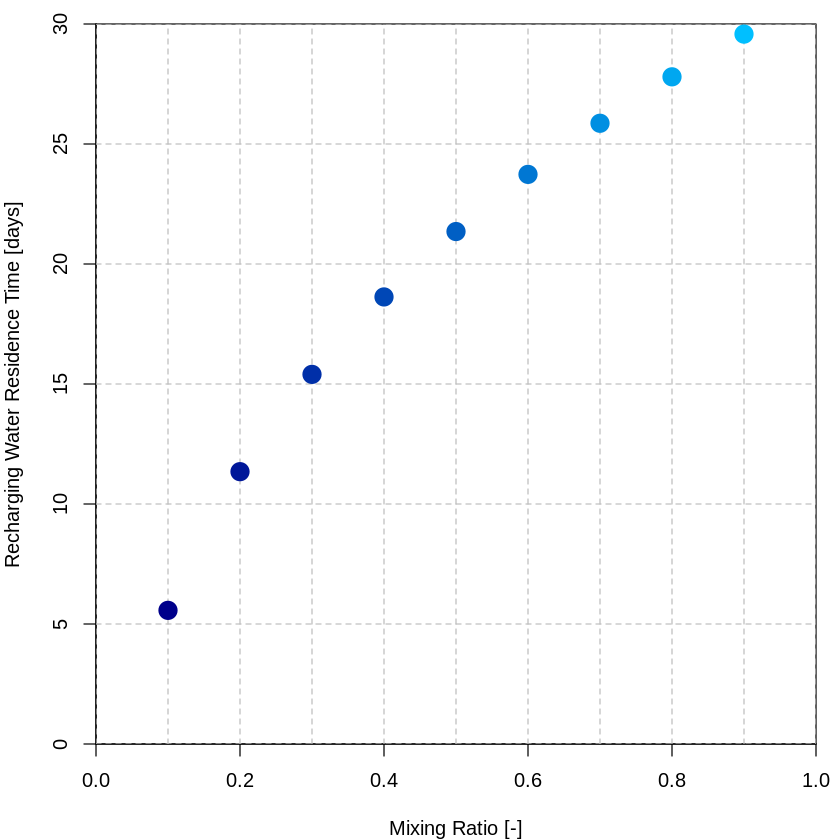

In [ ]:
par(mar = c(4,4,1,1))
par(mfrow = c(1,1))

plot(x = 0:1, y = 0:1, ylim = c(0, 30), xlim = c(0.,1), xlab = "Mixing Ratio [-]", ylab = "Recharging Water Residence Time [days]",
     type = 'n', yaxs = "i", xaxs = "i")
fun_color_range <- colorRampPalette(c("darkblue", "deepskyblue"))
cols <- fun_color_range(as.numeric(length(m_ratio)))
abline(h = seq(0,50,5), col = "grey", lty = 2)
abline(v = seq(0,1,0.1), col = "grey", lty = 2)

for (i in 1:length(m_ratio)) {
  result <- mixture_model_optimization_fct(end_m, c_in, c_obs, m_ratio[i], shape_alpha, aa, shape_alpha_deep, shape_beta_deep, a)
  points(m_ratio[i], result[[5]], col = cols[i], pch = 19, cex = 2)
}

